In [1]:
from anndata import read_h5ad
import pandas as pd
import numpy as np
import scvi
import scanpy as sc

%load_ext nb_black
use_cuda = True


In [2]:
import matplotlib.pyplot as plt

%matplotlib inline

In [3]:
data_path = "../TabulaSapiensData/"

In [4]:
adata = read_h5ad(data_path + "decontX/Pilot1_Pilot2.decontX.h5ad")

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9002. The TBB threading layer is disabled.
  warnings.warn(problem)
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


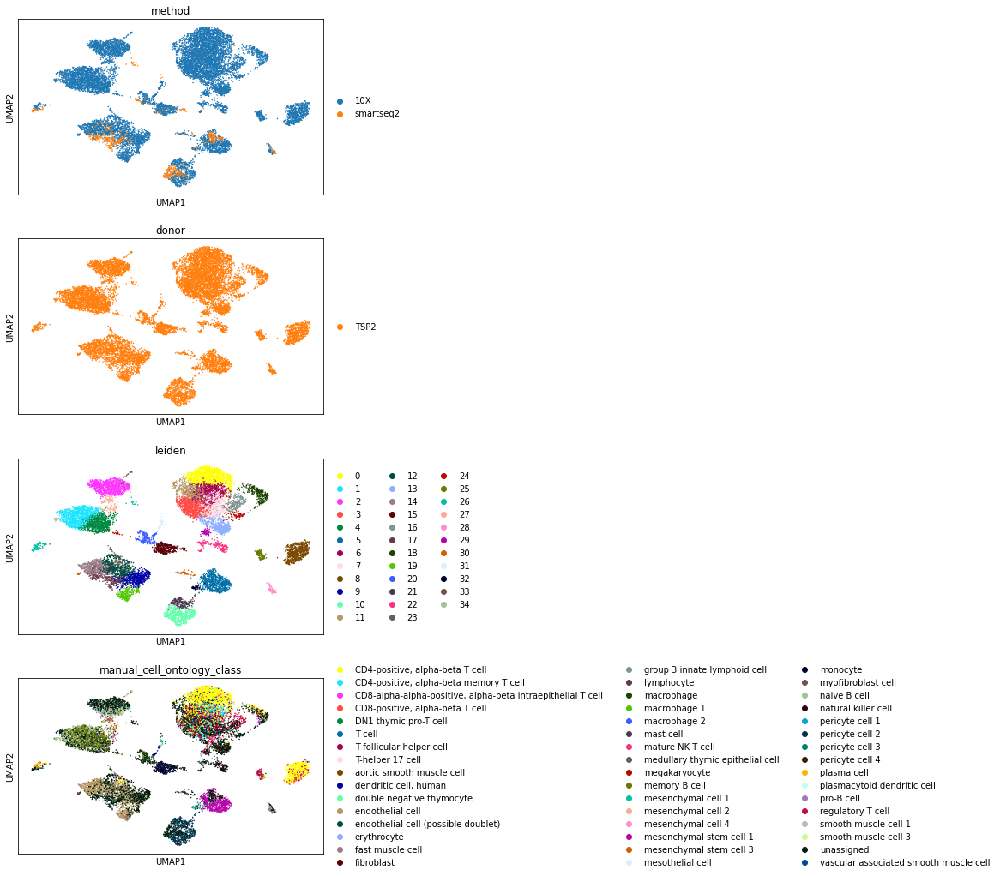

In [5]:
organ = "Thymus"
organ_adata = adata[adata.obs["tissue"] == organ]
sc.pp.neighbors(organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(organ_adata)
organ_adata.obsm["X_umap_decontX"] = organ_adata.obsm["X_umap"].copy()
sc.tl.leiden(organ_adata, resolution=2)
sc.pl.umap(
    organ_adata,
    color=["method", "donor", "leiden", "manual_cell_ontology_class"],
    ncols=1,
)
organ_adata.X = np.log1p(organ_adata.X)

# cluster to celltype correspondance
count is a matrix of cluster-cell type correspondance, where each row is a celltype, and each colum is a cluster. The entries to the matrix is the number of cells that is annotated as celltype *X* and cluster *Y*

In [6]:
count = {}
for c in np.unique(organ_adata.obs["leiden"]):
    count[c] = {}
    for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
        count[c][t] = np.sum(
            (organ_adata.obs["leiden"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )

count = pd.DataFrame.from_dict(count)

We can visualize the cluster assignment of each cell type through this heatmap. The color is normalized for each celltype 

<AxesSubplot:>

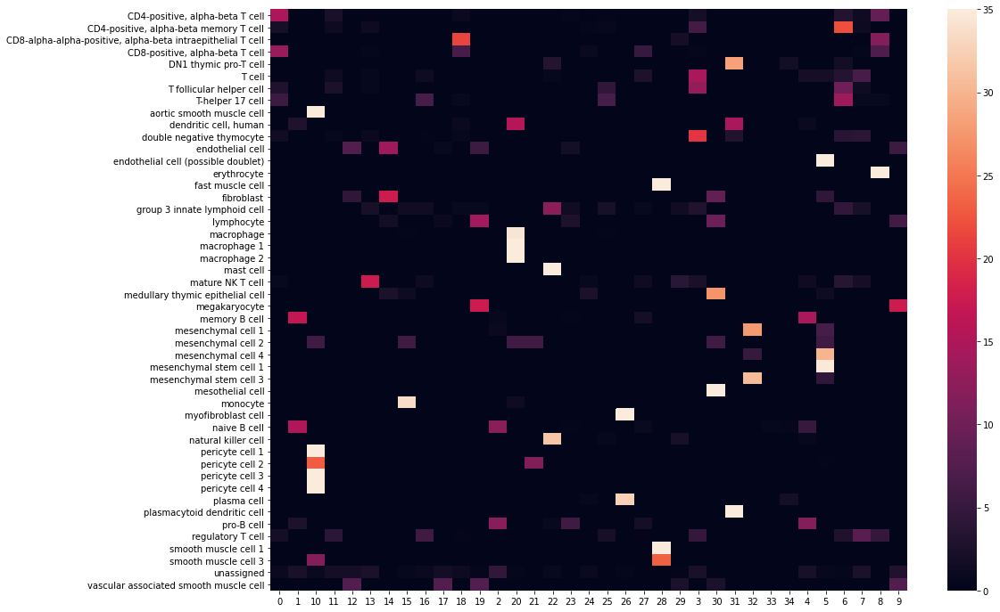

In [7]:
import seaborn

plt.figure(figsize=(16, 12))
seaborn.heatmap((count.T / count.mean(axis=1)).T)

# dictionary of cell type composition of each cluster 
What are clusters previously annotated as 

In [8]:
cluster_composition = {}
for x in count.columns.values:
    t = count.index[count[x] > 0].values
    freq = np.asarray([count.loc[y, x] for y in t]) / count[x].sum()
    res = [a + ": %.2f" % b for a, b in zip(t, freq)]
    cluster_composition[x] = res

In [9]:
cluster_composition["0"]

['CD4-positive, alpha-beta T cell: 0.78',
 'CD4-positive, alpha-beta memory T cell: 0.02',
 'CD8-positive, alpha-beta T cell: 0.02',
 'T follicular helper cell: 0.02',
 'T-helper 17 cell: 0.01',
 'double negative thymocyte: 0.00',
 'mature NK T cell: 0.00',
 'regulatory T cell: 0.03',
 'unassigned: 0.10']

# Reassign pure clusters
If a cluster is very pure (>95% of annotated cells come from the same celltype, we reassign the clusters to all have the same labels) 

In [10]:
def Purity(x):
    names = x.index
    x = np.asarray(x).ravel()
    x = x[names != "unassigned"]
    return (np.max(x) / np.sum(x), names[np.argmax(x)])

In [11]:
cluster_purity = count.apply(Purity, axis=0).T
confident_clusters = cluster_purity[cluster_purity[0] > 0.95].index

In [12]:
for i in confident_clusters:
    organ_adata.obs.loc[
        organ_adata.obs["leiden"] == i, "new_manual_cell_ontology_class"
    ] = cluster_purity.loc[i, 1]

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'new_manual_cell_ontology_class' as categorical


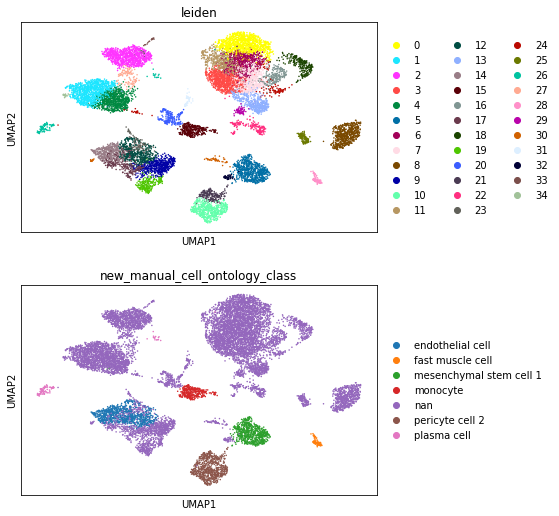

In [13]:
sc.pl.umap(
    organ_adata,
    color=["leiden", "new_manual_cell_ontology_class"],
    ncols=1,
)

# Sankey Diagram between cluster and cell types

In [14]:
from utils.colorDict import donor_colors, method_colors, compartment_colors, tissue_colors

In [15]:
from utils.plotting_utils import *
from utils.colorDict import compartment_colors

import plotly
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.io as pio

pio.renderers.default = "notebook"

init_notebook_mode(connected=True)

In [16]:
df = pd.DataFrame(columns=["celltype", "compartment", "count"])
for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
    for c in np.unique(organ_adata.obs["compartment_pred_svm"]):
        x = np.sum(
            (organ_adata.obs["compartment_pred_svm"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )
        df = df.append(
            pd.DataFrame([t, c, x], index=["celltype", "compartment", "count"]).T,
            ignore_index=True,
        )


fig = genSankey(
    df,
    cat_cols_color=[compartment_colors(), "#00A1E0"],
    cat_cols=["compartment", "celltype"],
    value_cols="count",
    title="celltype-compartment",
)
iplot(fig, validate=False)
plotly.offline.plot(
    fig, validate=False, filename="figures/celltype_sankey_%s" % organ + ".html"
)  # , output_type='div')

'figures/celltype_sankey_Thymus.html'

# visualize compartment markers

In [17]:
compartment_markers = {
    "Epithelial": ["CDH1", "CLDN4", "EPCAM"],
    "Endothelial": ["CA4", "CDH5", "CLDN5", "PECAM1", "VWF"],
    "Stromal": ["BGN", "DCN", "COL1A2"],
    "Immune": ["LCP1", "PTPRC", "RAC2"],
}

In [18]:
for x in compartment_markers.keys():
    sc.tl.score_genes(organ_adata, compartment_markers[x], score_name="%s_score" % x)

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



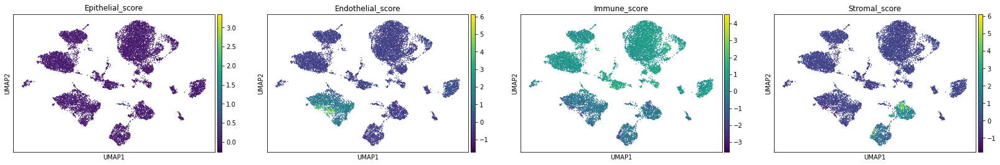

In [19]:
sc.pl.umap(
    organ_adata,
    color=["Epithelial_score", "Endothelial_score", "Immune_score", "Stromal_score"],
)

# Find markers for each cluster

In [20]:
sc.tl.rank_genes_groups(organ_adata, groupby="leiden", method="wilcoxon")

In [21]:
def FormatDE(res):
    groups = res['scores'].dtype.names
    df_res = {}
    for group in groups:
        df = pd.DataFrame([res['scores'][group],
                           res['logfoldchanges'][group],res['pvals_adj'][group]], 
                           columns=res['names'][group],
                           index=['wilcoxon_score','log fold change','adjusted pvalue'])
        df_res[group] = df
    return df_res


In [22]:
DE = FormatDE(organ_adata.uns["rank_genes_groups"])

### top positive marker genes

In [23]:
for x in DE.keys():
    print(x)
    display(DE[x].T[:20])

0


,wilcoxon_score,log fold change,adjusted pvalue
RPS12,42.249374,1.750693,0.000000e+00
BCL11B,41.448414,2.939640,0.000000e+00
RPL30,39.888783,1.387424,0.000000e+00
RPS13,39.593407,1.341799,0.000000e+00
RPL13,39.551025,1.424193,0.000000e+00
RPS27A,39.394897,1.365603,0.000000e+00
RPS23,39.130440,1.377719,0.000000e+00
RPL32,38.984493,1.344633,0.000000e+00
RPS3A,38.860058,1.347404,0.000000e+00
GAS5,38.465755,1.718212,0.000000e+00


1


,wilcoxon_score,log fold change,adjusted pvalue
MS4A1,44.076012,3.985715,0.000000e+00
HLA-DRA,42.627090,3.758863,0.000000e+00
CD79A,40.933594,3.446059,0.000000e+00
BANK1,40.916508,3.596833,0.000000e+00
HLA-DPA1,40.906361,2.987997,0.000000e+00
CD74,39.811852,3.400015,0.000000e+00
HLA-DPB1,39.417831,2.865283,0.000000e+00
TNFRSF13C,39.022633,3.173984,0.000000e+00
IGKC,38.890385,3.491439,0.000000e+00
CD52,38.274433,2.343762,0.000000e+00


2


,wilcoxon_score,log fold change,adjusted pvalue
IGHM,48.828457,6.853106,0.000000e+00
IGHD,46.859795,6.972045,0.000000e+00
AL139020.1,44.131062,8.487684,0.000000e+00
CD79A,42.084095,3.822562,0.000000e+00
CD37,40.460785,2.527530,0.000000e+00
MS4A1,39.299809,3.586351,0.000000e+00
IGKC,38.500870,3.780895,0.000000e+00
CD79B,37.489372,3.005656,1.009844e-303
LINC00926,36.483376,3.986221,1.331154e-287
HLA-DRA,35.260750,3.221347,1.256633e-268


3


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,35.906765,3.528007,1.410248e-277
CD2,28.662745,2.327266,3.273560e-176
FYB1,28.195463,2.111099,9.782102e-171
BCL11B,27.975100,2.152049,3.843836e-168
CD69,26.857544,1.969764,6.756338e-155
IL6ST,25.526644,1.627940,8.392036e-140
SRGN,25.350605,1.553173,6.512084e-138
TRAC,25.251099,1.940200,7.205200e-137
ZFP36L2,25.232574,1.367465,1.035801e-136
CD3E,24.844000,1.829860,1.606753e-132


4


,wilcoxon_score,log fold change,adjusted pvalue
TNFRSF13C,37.638294,3.420166,2.993334e-305
MS4A1,35.812523,3.454691,2.075538e-276
BANK1,35.165260,3.409539,1.333386e-266
CD79A,33.027855,3.029915,4.761564e-235
ADAM28,32.572712,3.384259,1.175860e-228
IRF8,32.054813,3.014306,1.845658e-221
IGKC,31.953415,3.023080,4.073493e-220
BLK,31.577978,3.489178,5.451119e-215
HLA-DRA,31.343107,3.026459,7.900579e-212
TP53INP1,30.934883,2.884753,2.388868e-206


5


,wilcoxon_score,log fold change,adjusted pvalue
DCN,43.007393,10.093813,0.0
CFD,42.995987,9.764910,0.0
APOD,42.867512,10.478470,0.0
LAMA2,42.289387,8.786678,0.0
C1S,42.069065,7.706152,0.0
C1R,41.948650,7.123995,0.0
SERPINF1,41.779701,7.153645,0.0
COL6A3,41.732216,7.936203,0.0
ADH1B,41.425308,8.819630,0.0
PRELP,41.132492,7.884228,0.0


6


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,33.499714,3.672799,2.864680e-241
IL32,30.142036,2.536863,4.015134e-195
RPS29,30.021400,1.607540,1.012422e-193
RPS15A,28.875147,1.348724,3.605712e-179
TRAC,28.528013,2.500346,6.152299e-175
RPS12,28.521893,1.506857,6.152299e-175
BCL11B,28.468695,2.495490,2.405785e-174
LTB,27.977329,2.474540,2.256935e-168
RPL39,27.867214,1.363912,4.358844e-167
CD69,27.752407,2.276413,9.594136e-166


7


,wilcoxon_score,log fold change,adjusted pvalue
BCL11B,25.132059,2.151767,1.307046e-134
IPCEF1,23.955996,2.373016,2.355399e-122
ETS1,21.972874,1.429188,1.027264e-102
PIK3IP1,21.913563,1.509215,2.838761e-102
FYN,21.163467,1.481561,2.441831e-95
FYB1,20.964199,1.731357,1.366231e-93
IL7R,20.823326,2.114968,2.237609e-92
TRAC,19.573763,1.642220,1.693123e-81
RGS1,19.568365,2.229608,1.694077e-81
AAK1,19.453407,1.404877,1.459435e-80


8


,wilcoxon_score,log fold change,adjusted pvalue
SOX4,38.518196,5.093731,0.000000e+00
DDIT4,36.265171,3.000713,2.811117e-284
CD3E,35.441833,3.145802,1.521002e-271
NDFIP1,34.927704,2.898425,8.749614e-264
ITM2A,33.663208,2.926534,5.346744e-245
CCR9,32.094250,7.320630,1.200774e-222
MT-ATP8,31.885458,2.582326,9.261025e-220
CD3D,31.159924,2.764361,7.068170e-210
SARAF,31.157633,1.947399,7.354464e-210
SLAMF1,30.735918,4.125097,3.364638e-204


9


,wilcoxon_score,log fold change,adjusted pvalue
CD300LG,36.438431,5.290140,6.175659e-286
BTNL9,35.650761,4.961783,6.749571e-274
ADGRF5,35.548958,4.710662,1.692038e-272
CD36,35.337009,4.903787,2.336337e-269
VWF,34.995491,4.638580,3.101937e-264
ANXA3,34.926498,5.009423,2.890004e-263
FABP4,34.873253,5.992526,1.590908e-262
SLC9A3R2,34.537384,4.494935,1.622281e-257
IFI27,33.251518,4.453457,1.269526e-238
CAVIN2,33.123051,4.415226,8.149511e-237


10


,wilcoxon_score,log fold change,adjusted pvalue
TAGLN,38.082211,9.455570,0.000000e+00
MYL9,38.009441,7.639632,0.000000e+00
ACTA2,37.716682,10.725393,0.000000e+00
CALD1,37.150856,6.968653,6.249693e-298
AP002956.1,36.990894,6.927003,1.888701e-295
TPM2,36.954762,9.043285,5.992144e-295
IGFBP5,36.474972,7.315879,2.326153e-287
NOTCH3,36.167919,8.096111,1.431438e-282
IGFBP7,35.893906,7.001006,2.487286e-278
DSTN,35.598545,5.778581,8.686126e-274


11


,wilcoxon_score,log fold change,adjusted pvalue
BCL11B,19.158710,1.787722,4.820009e-77
RPS12,19.106499,1.116402,6.562145e-77
TRAC,18.076521,1.684059,7.180897e-69
IL32,17.328789,1.461656,2.799036e-63
RPS29,17.116072,1.071277,8.287661e-62
RPS3,16.753626,0.844576,3.484910e-59
CD3D,16.364784,1.478100,1.826218e-56
RPL30,16.350916,0.851542,2.102134e-56
CD3E,16.330378,1.461381,2.717646e-56
LDHB,16.316296,1.114994,3.178360e-56


12


,wilcoxon_score,log fold change,adjusted pvalue
PLVAP,31.580812,4.678222,3.987155e-214
LIFR,31.126211,4.382691,3.133815e-208
AQP1,30.673820,4.407582,2.496233e-202
VWF,30.487247,3.995157,5.660490e-200
A2M,30.175970,4.019178,5.764953e-196
FLT1,29.841015,4.090562,1.126582e-191
NPDC1,29.607552,3.616667,1.004674e-188
PECAM1,29.181795,3.520408,2.159376e-183
ADGRL4,28.455853,3.677341,2.428222e-174
IFI27,28.335220,3.821323,6.813613e-173


13


,wilcoxon_score,log fold change,adjusted pvalue
CCL5,32.486076,6.373082,9.872133e-227
GZMA,27.989054,5.419762,6.500026e-168
GZMK,27.971512,6.521884,7.083450e-168
CCL4,23.544430,5.566283,2.106997e-118
IL32,23.481520,2.240357,7.418755e-118
DUSP2,22.925030,2.463007,2.566295e-112
CD2,22.589468,2.374887,4.626002e-109
CST7,22.533493,4.309665,1.434629e-108
PARP8,21.928703,2.351166,6.785297e-103
PPP2R5C,21.762030,1.695157,2.406601e-101


14


,wilcoxon_score,log fold change,adjusted pvalue
ACKR1,33.559399,8.069036,3.865246e-242
LIFR,33.393070,5.881851,5.087329e-240
AQP1,33.352062,6.186588,1.334452e-239
PLVAP,33.225399,6.293117,6.810076e-238
NPDC1,33.088615,5.116611,5.101701e-236
PECAM1,32.556366,5.054788,1.669465e-228
ADIRF,32.407051,5.829035,1.836476e-226
TSPAN7,32.246967,5.049889,2.855025e-224
ECSCR,32.177631,5.174088,2.373529e-223
SNCG,31.834782,5.006502,1.258669e-218


15


,wilcoxon_score,log fold change,adjusted pvalue
S100A9,31.470312,11.890231,1.303453e-212
S100A8,31.313585,12.185616,8.973059e-211
MNDA,30.364355,7.805182,3.187246e-198
TYROBP,30.306156,7.251105,1.399701e-197
LYZ,30.180334,9.970683,5.052996e-196
VCAN,29.864414,8.230605,5.598324e-192
FCER1G,29.743372,6.559038,1.776624e-190
CD163,29.697653,7.489171,6.058869e-190
CTSS,29.648388,5.811108,2.327125e-189
MS4A6A,29.258526,7.268220,2.059260e-184


16


,wilcoxon_score,log fold change,adjusted pvalue
IL32,24.731279,3.867284,2.902464e-130
CD2,20.471106,3.075651,1.147024e-88
CTLA4,20.095768,4.348345,1.576985e-85
S100A4,19.450527,2.618030,4.245255e-80
TRAC,19.297268,2.750734,6.667033e-79
RGS1,18.819872,3.251756,5.093230e-75
CD3D,18.060602,2.504489,5.475687e-69
HLA-A,16.600273,1.287452,5.105158e-58
PRDM1,16.295767,2.934498,6.918403e-56
SKAP1,16.192495,2.579596,3.353815e-55


17


,wilcoxon_score,log fold change,adjusted pvalue
VWF,24.981602,8.808202,5.704050e-133
IFI27,24.386438,8.143491,7.011465e-127
A2M,24.256212,8.645624,1.115748e-125
IFITM3,24.186533,7.738781,4.537941e-125
SPARCL1,24.161131,8.526715,6.715445e-125
PECAM1,23.945408,7.891476,1.012222e-122
GSN,23.834135,7.691699,1.243949e-121
MT-CO1,23.583529,5.275700,4.185906e-119
TMSB10,23.465475,5.391276,6.010643e-118
MT-CYB,23.159523,5.625451,6.861785e-115


18


,wilcoxon_score,log fold change,adjusted pvalue
SOX4,23.832081,4.899834,9.145555e-121
LEF1,20.409542,3.076404,4.049265e-88
CD3D,19.369574,2.682419,2.735633e-79
SATB1,18.964437,2.600016,4.939217e-76
BCL11B,17.350208,2.353112,1.928294e-63
CD3G,17.251125,2.378229,9.229186e-63
IKZF1,16.924860,1.924584,2.171148e-60
BCL2L11,16.676773,3.033398,1.264986e-58
TNFAIP3,15.691278,2.368979,1.021544e-51
NUCB2,15.424287,2.133461,5.513661e-50


19


,wilcoxon_score,log fold change,adjusted pvalue
TM4SF1,25.368343,6.137462,3.319977e-137
PODXL,24.636129,5.077472,1.525535e-129
SEMA3G,24.596249,5.681818,2.718807e-129
SLC9A3R2,24.560717,5.635268,4.890379e-129
ICAM2,23.732246,4.292528,1.973293e-120
PALMD,23.540909,4.547178,1.526296e-118
DOCK9,23.435999,4.050535,1.544517e-117
STOM,23.244560,3.896787,1.188215e-115
PTPRB,23.222870,4.544476,1.749889e-115
EPAS1,23.202463,4.690957,2.531367e-115


20


,wilcoxon_score,log fold change,adjusted pvalue
CD163,23.785801,8.786839,2.757989e-120
CTSB,22.951887,6.722847,4.153037e-112
MRC1,22.396364,10.354380,8.380072e-107
TYROBP,21.945042,7.325308,1.421421e-102
C1QB,21.921768,11.591262,1.896565e-102
C1QA,21.900658,10.857792,2.512405e-102
MS4A7,21.555027,7.323751,3.994670e-99
FCER1G,21.056170,6.997307,1.477414e-94
C1QC,20.973536,11.372407,7.485383e-94
MAFB,20.730532,6.113466,1.081748e-91


21


,wilcoxon_score,log fold change,adjusted pvalue
STEAP4,23.714506,7.412058,1.504030e-119
TAGLN,22.256994,5.780883,2.840569e-105
MYL9,22.183472,4.847866,9.733077e-105
IGFBP5,22.034435,5.983934,1.982652e-103
PDGFRB,21.430157,4.771426,7.665158e-98
CALD1,21.307339,4.473202,8.097470e-97
NOTCH3,21.301460,5.172573,8.097470e-97
RGS5,21.099463,6.628122,5.261933e-95
MAP1B,20.451227,4.247987,3.448824e-89
NR2F2,20.442366,3.940136,3.759669e-89


22


,wilcoxon_score,log fold change,adjusted pvalue
AREG,18.040173,3.740243,5.548439e-68
KLRB1,16.540241,3.954532,5.541657e-57
FCER1G,16.394621,4.212146,4.100092e-56
GNLY,16.258900,8.373502,2.843061e-55
CTSW,15.968458,4.477486,2.079675e-53
KLRD1,15.912765,7.045954,4.346291e-53
TYROBP,15.560439,3.743859,8.841498e-51
NKG7,15.465397,6.438506,3.497208e-50
PRF1,14.608166,6.145928,1.047614e-44
HOPX,14.554754,4.221418,2.004579e-44


23


,wilcoxon_score,log fold change,adjusted pvalue
BTNL9,10.050084,2.467481,2.701804e-19
UACA,8.048102,1.462007,2.158557e-12
SPTBN1,7.306532,1.178481,2.881744e-10
SLC9A3R2,7.302756,2.037607,2.911810e-10
TACC1,7.249185,0.942915,4.183638e-10
HYAL2,7.242380,1.795513,4.325762e-10
FLT1,7.151999,1.869429,7.866817e-10
VWF,6.947436,1.677142,2.737350e-09
PECAM1,6.769803,1.467091,8.435269e-09
PODXL,6.729908,1.891778,1.063228e-08


24


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,6.994121,1.637885,5.169080e-10
BCL11B,6.952731,1.360261,6.848070e-10
SERINC5,5.959947,1.287319,3.631799e-07
SEMA4D,5.450369,1.043186,6.076241e-06
CLEC2D,5.367519,1.042519,9.361399e-06
ATM,4.979817,0.710249,6.471075e-05
CD28,4.878103,1.374974,1.052694e-04
TXK,4.840258,1.104409,1.239237e-04
CASP8,4.811290,1.004902,1.426189e-04
PDE3B,4.791012,1.438900,1.565820e-04


25


,wilcoxon_score,log fold change,adjusted pvalue
IFITM1,14.989701,2.563715,6.309225e-47
SARAF,13.770191,1.962069,1.511758e-39
CD3E,12.839069,2.421420,2.429824e-34
ALDOA,12.598100,2.797107,4.716009e-33
PTPRCAP,12.307140,5.345939,1.683063e-31
RPS26,12.270361,1.235094,2.481456e-31
MT-ATP8,12.127157,1.959190,1.395163e-30
IL32,11.451962,2.171288,3.866620e-27
CORO1A,11.106831,1.790485,1.849015e-25
GABARAP,10.937081,1.950279,1.187111e-24


26


,wilcoxon_score,log fold change,adjusted pvalue
MZB1,15.302138,11.043177,4.355526e-48
DERL3,14.375872,8.973460,2.158783e-42
FKBP11,14.288021,6.618406,5.099879e-42
SSR4,14.149706,6.356054,2.760120e-41
SPCS2,14.120351,5.467803,3.350537e-41
TENT5C,13.835222,5.367516,1.533095e-39
SPAG4,13.503669,9.851148,1.251224e-37
HERPUD1,13.488732,5.832660,1.340804e-37
XBP1,13.369533,6.053322,5.959708e-37
SDC1,13.229310,11.152909,3.498647e-36


27


,wilcoxon_score,log fold change,adjusted pvalue
BTG1,14.740190,1.795902,2.094517e-44
CD37,14.158090,2.404165,4.899706e-41
CXCR4,13.586899,2.173877,9.398613e-38
CD52,13.261670,2.364503,5.683846e-36
FCMR,12.687399,2.204808,8.177574e-33
SMAP2,12.558679,1.996632,3.495232e-32
RPS29,12.476245,1.571162,8.462252e-32
RPL28,12.454920,1.356177,9.675544e-32
RPSA,12.265975,1.391782,9.022951e-31
STK17A,12.105703,1.975021,5.799978e-30


28


,wilcoxon_score,log fold change,adjusted pvalue
NEB,16.724781,13.067902,1.472850e-58
TTN,16.723042,9.852751,1.472850e-58
CMYA5,16.716898,11.362746,1.472850e-58
TNNT3,16.716089,13.496800,1.472850e-58
MYBPC1,16.550390,13.913112,1.259589e-57
TNNI2,16.547676,13.864688,1.259589e-57
TRDN,16.545977,13.562738,1.259589e-57
PDE4DIP,16.108675,6.586579,1.450337e-54
MYL1,16.017002,15.984821,5.257565e-54
CKM,16.016357,14.822072,5.257565e-54


29


,wilcoxon_score,log fold change,adjusted pvalue
CCL5,14.351391,5.666931,6.147276e-42
GZMA,14.180199,5.744933,3.576396e-41
NKG7,13.745368,5.231162,1.065469e-38
FGFBP2,13.199712,6.392328,1.296196e-35
CCL4,12.709697,5.126657,6.150359e-33
PRF1,12.568901,5.310619,3.071482e-32
LYAR,12.391833,3.601269,2.433447e-31
KLRD1,12.256988,6.110442,1.134154e-30
GNLY,12.180101,6.558995,2.595423e-30
GZMB,11.855580,6.077758,9.876617e-29


30


,wilcoxon_score,log fold change,adjusted pvalue
MT-CO1,10.401472,2.547017,1.437208e-20
MT-RNR2,10.241668,2.142451,2.531272e-20
CLU,10.004195,4.773770,2.149848e-19
CD9,9.933786,4.680820,3.382181e-19
MT-CYB,9.918848,2.214475,3.382181e-19
MT-RNR1,9.740075,2.102870,1.645058e-18
MT-ATP6,9.730473,2.114709,1.645058e-18
MT-CO2,9.704795,2.241864,1.871222e-18
MT-CO3,9.694608,2.296788,1.871222e-18
MTATP6P1,9.405110,2.188323,2.781634e-17


31


,wilcoxon_score,log fold change,adjusted pvalue
SOX4,11.445949,5.589552,1.450517e-25
H2AFY,11.094170,4.259222,3.215017e-24
RPS24,11.071736,2.471890,3.215017e-24
CDK6,11.050314,4.832919,3.215017e-24
APEX1,10.935078,3.229171,9.223637e-24
SEPT6,10.782542,3.147545,4.083824e-23
HMGB1,10.688998,2.269657,9.638062e-23
RACK1,10.531965,2.201905,4.528296e-22
HMGN1,10.486593,2.799070,6.180435e-22
SNHG29,10.481571,2.642644,6.180435e-22


32


,wilcoxon_score,log fold change,adjusted pvalue
CCDC80,11.226091,8.838070,7.045917e-25
MFAP5,11.221997,9.775442,7.045917e-25
FBN1,11.211257,8.758267,7.045917e-25
SCARA5,11.175358,7.731102,7.922906e-25
FSTL1,11.126225,8.133648,1.101008e-24
FBLN1,11.102510,7.548572,1.196723e-24
MFAP4,11.069301,7.105832,1.486675e-24
SEMA3C,11.044952,9.587314,1.706426e-24
DCN,11.029881,9.462597,1.793764e-24
TGFBR3,11.016490,6.291882,1.873406e-24


33


,wilcoxon_score,log fold change,adjusted pvalue
HLA-DRB1,7.117689,4.354797,3.787337e-08
HLA-DQA2,7.095733,7.012536,3.787337e-08
CD74,6.973578,4.594921,6.063207e-08
CD79A,6.698829,3.948563,3.092088e-07
HLA-DRA,6.412068,3.910343,1.298971e-06
HLA-DQB1,6.400908,3.728902,1.298971e-06
HLA-DPB1,6.313694,3.423821,1.603928e-06
HLA-DPA1,6.278236,3.243667,1.832648e-06
MT-ATP8,6.193851,2.674043,2.658748e-06
CD37,6.054971,2.497187,5.511931e-06


34


,wilcoxon_score,log fold change,adjusted pvalue
ODC1,6.483379,4.036908,0.000005
NME1,6.106778,4.124049,0.000030
CYBA,6.030602,2.605858,0.000032
PSME2,5.902373,2.899146,0.000042
RANBP1,5.901578,2.811612,0.000042
EIF5A,5.789287,2.502347,0.000069
HSPD1,5.756319,2.437248,0.000070
SRM,5.737995,3.266704,0.000070
C1QBP,5.316364,2.505193,0.000692
HSPE1,5.264575,2.484019,0.000812


### for cluster 0 plot the top marker genes

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



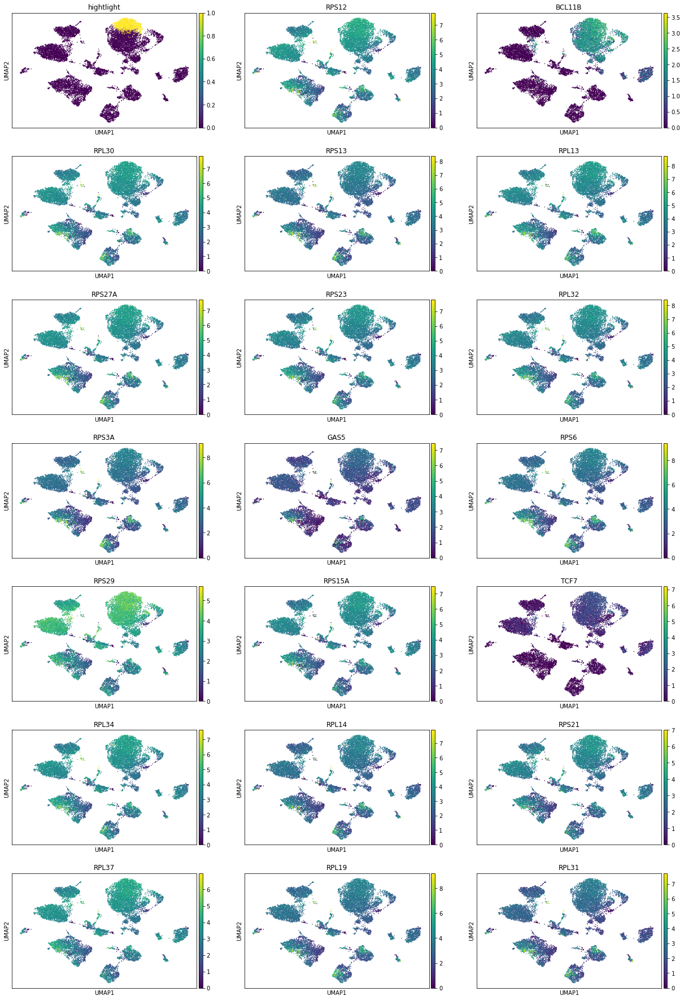

In [24]:
topgenes = list(DE["0"].T[:20].index)
organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == "0"
sc.pl.umap(
    organ_adata,
    color=["hightlight"] + topgenes,
    ncols=3,
)

You can do this for other clusters as well. Here I plot the top 5 genes for all other clusters

0


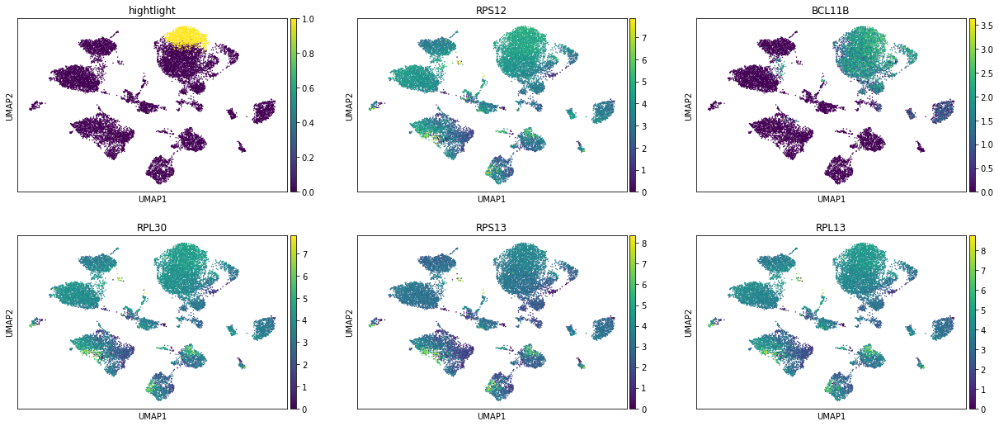

1


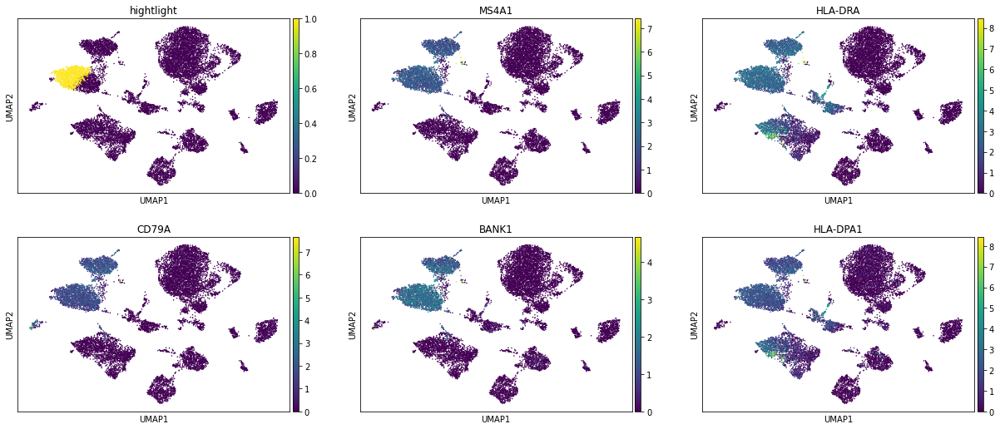

2


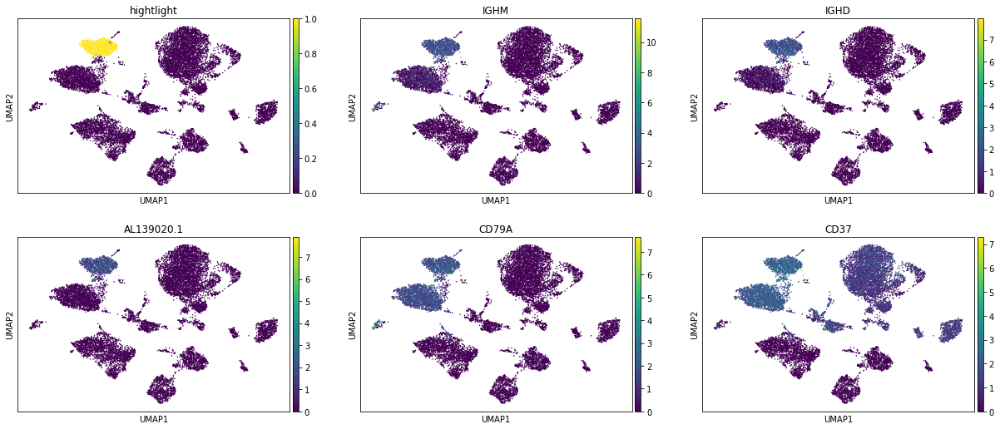

3


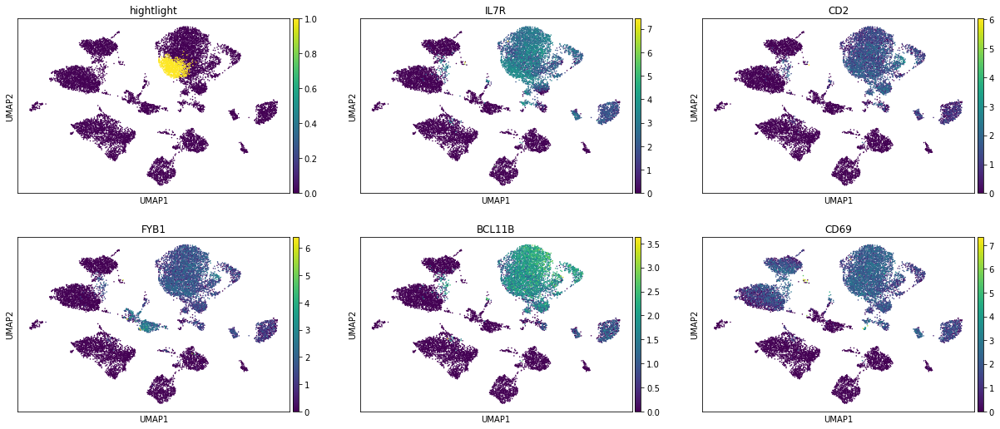

4


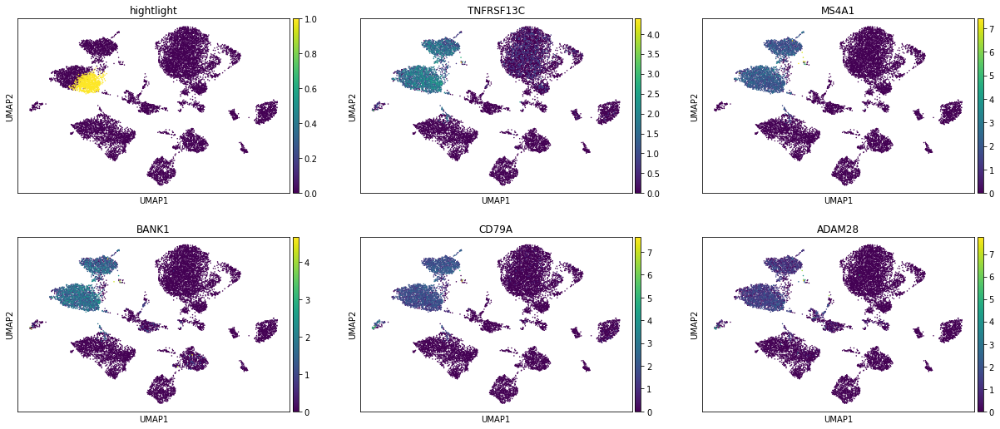

5


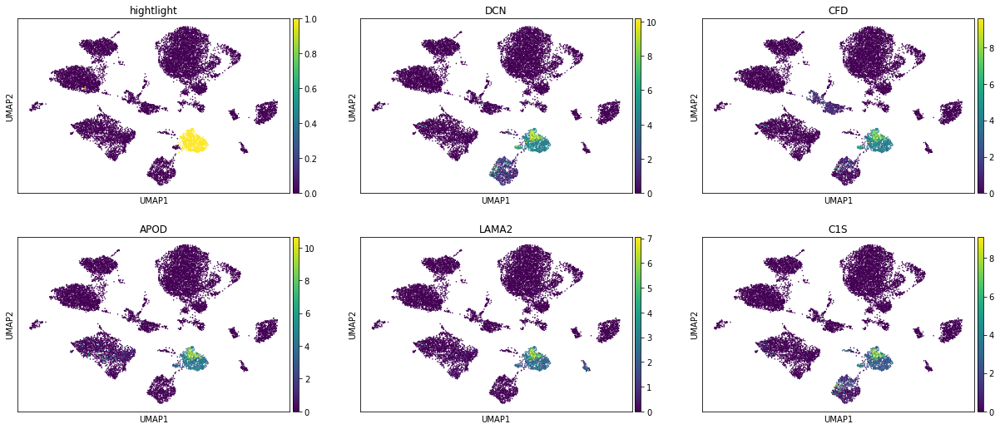

6


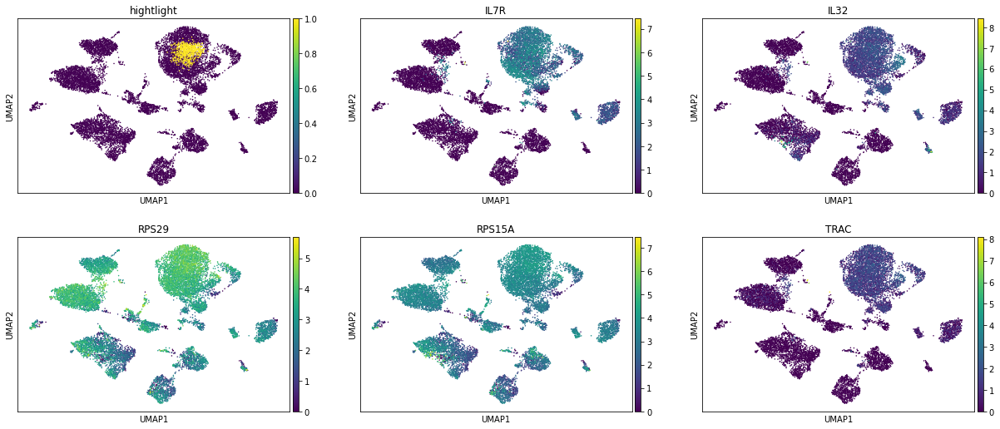

7


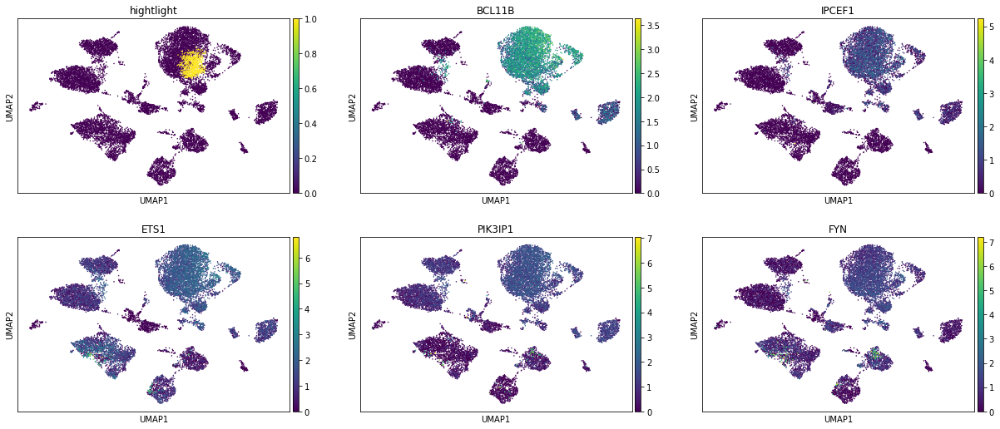

8


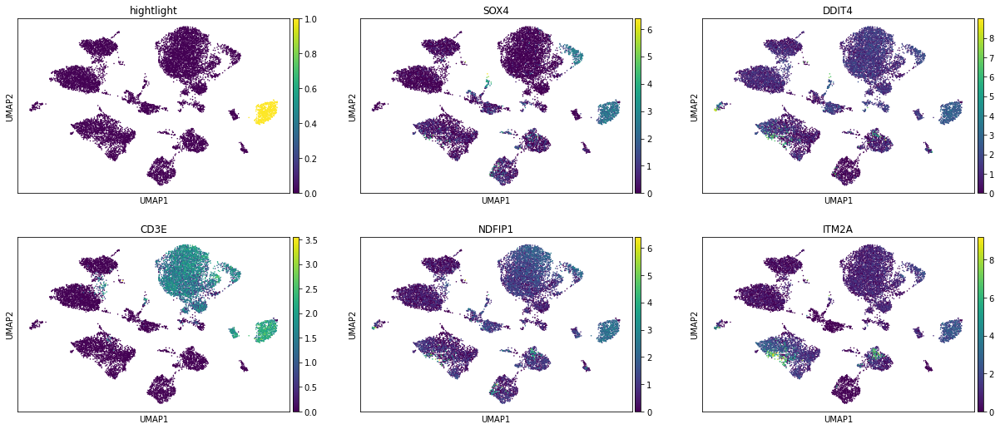

9


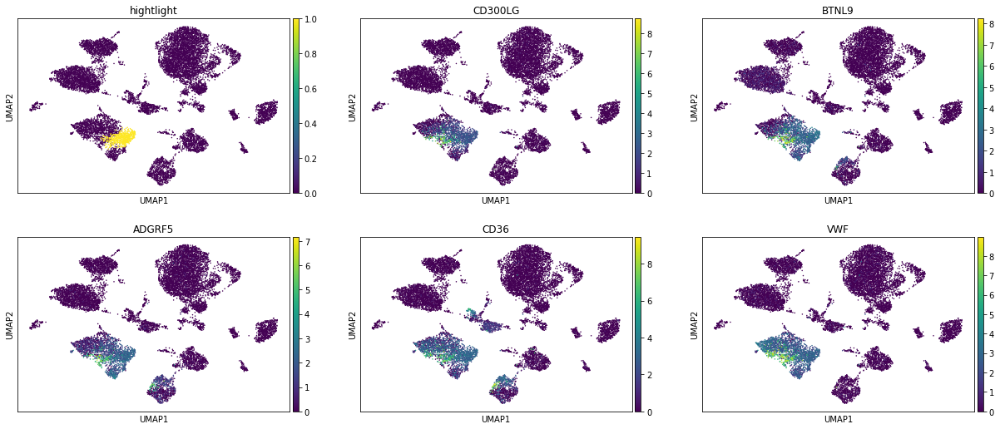

10


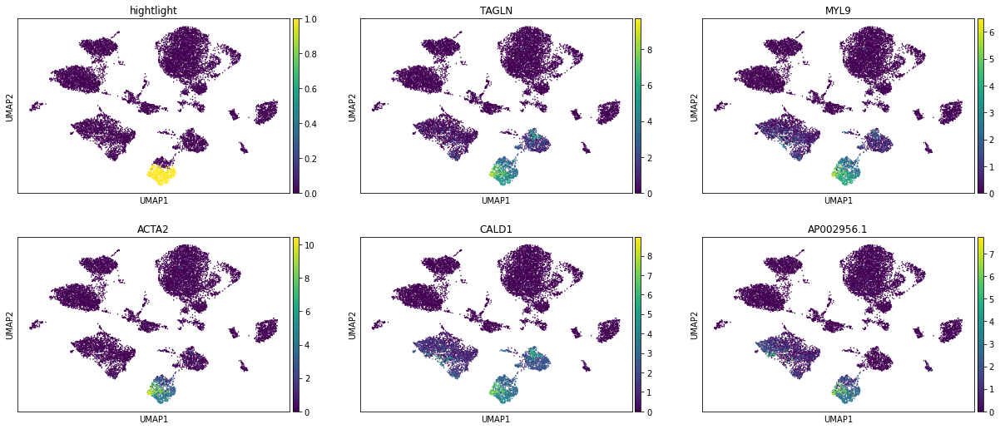

11


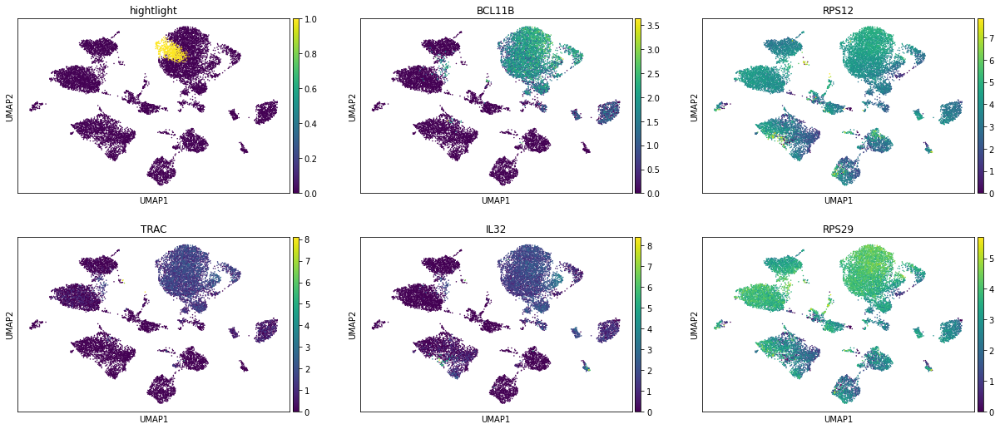

12


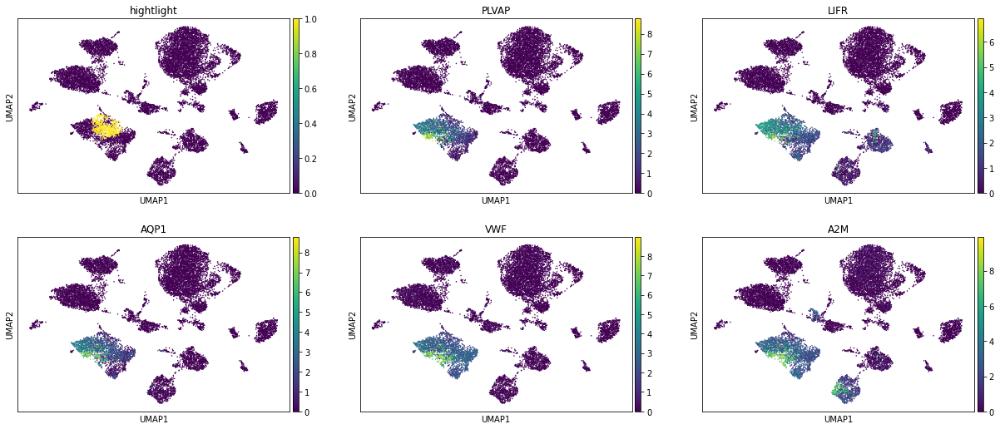

13


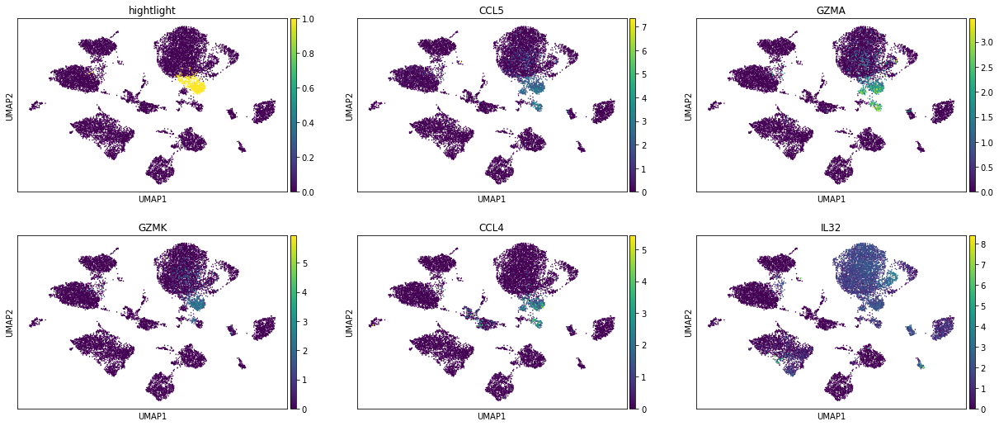

14


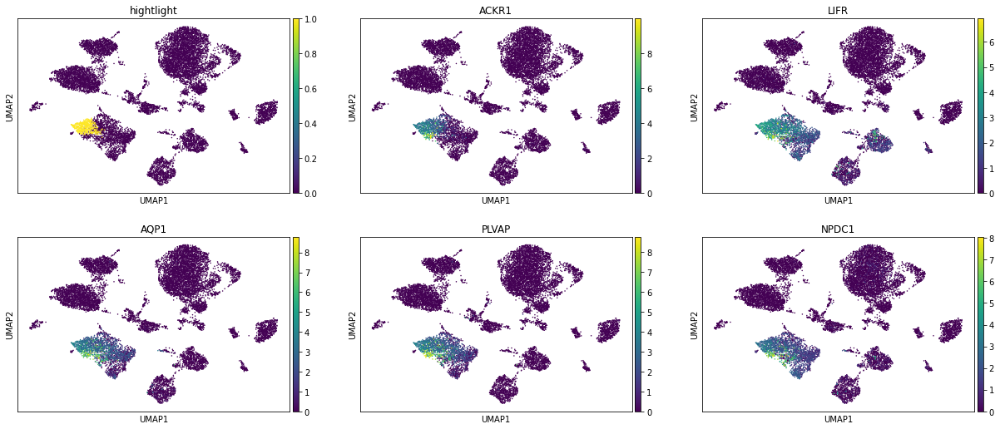

15


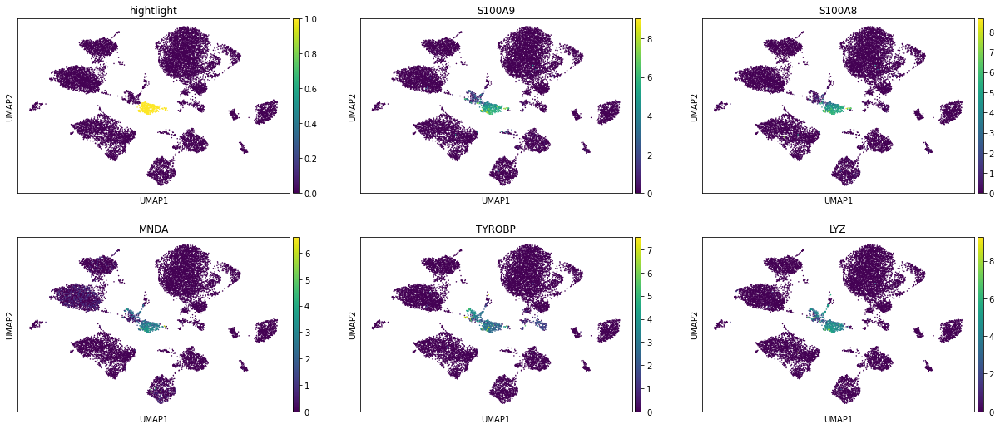

16


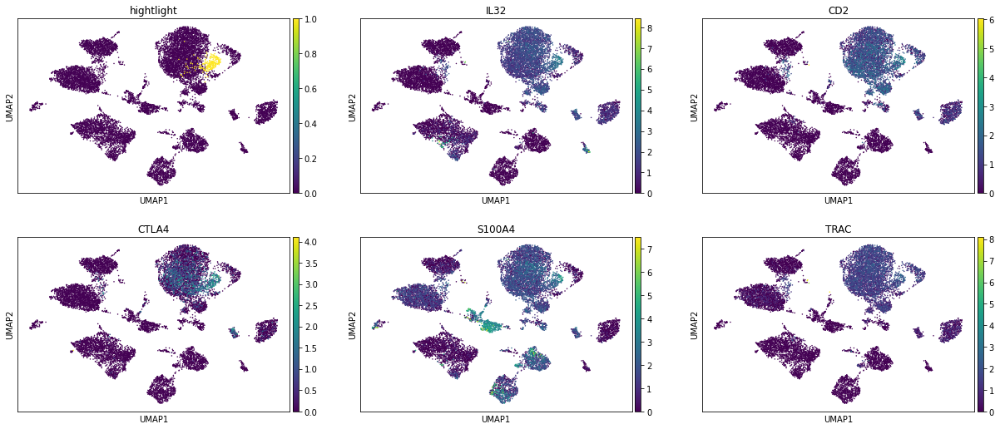

17


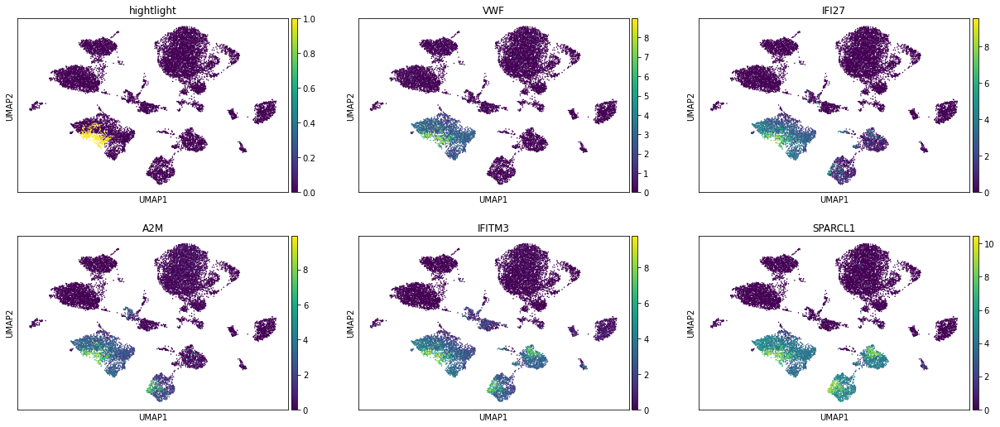

18


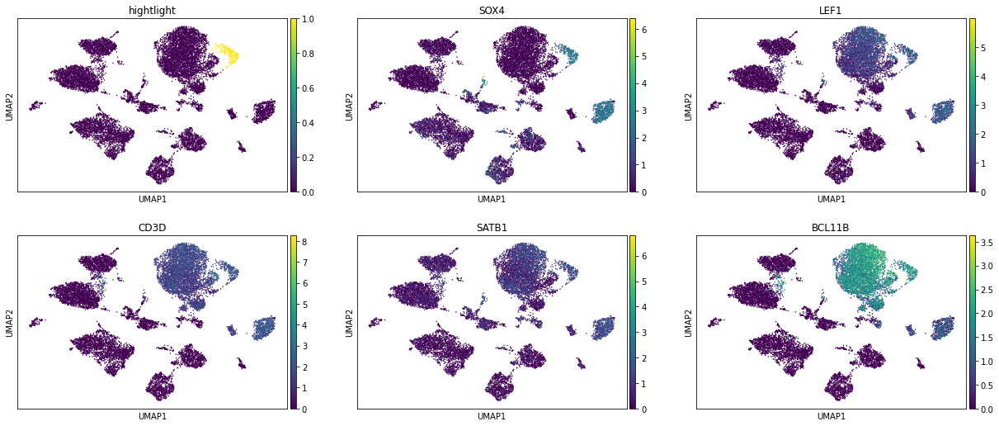

19


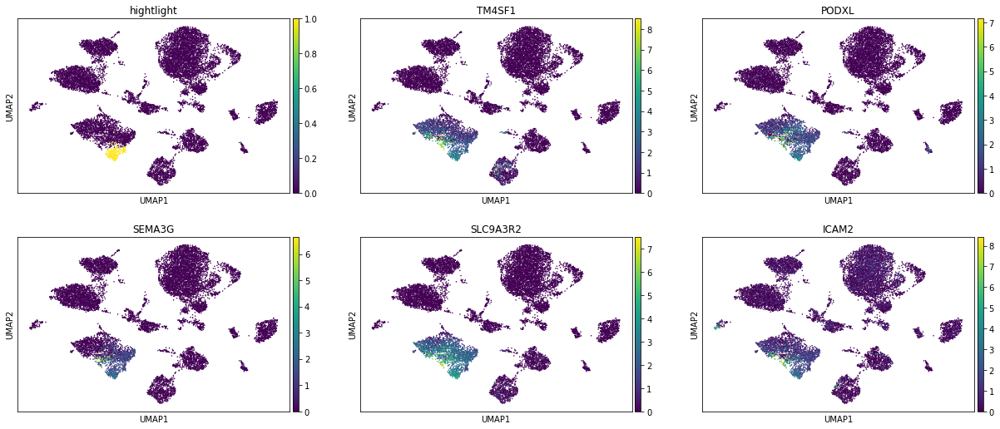

20


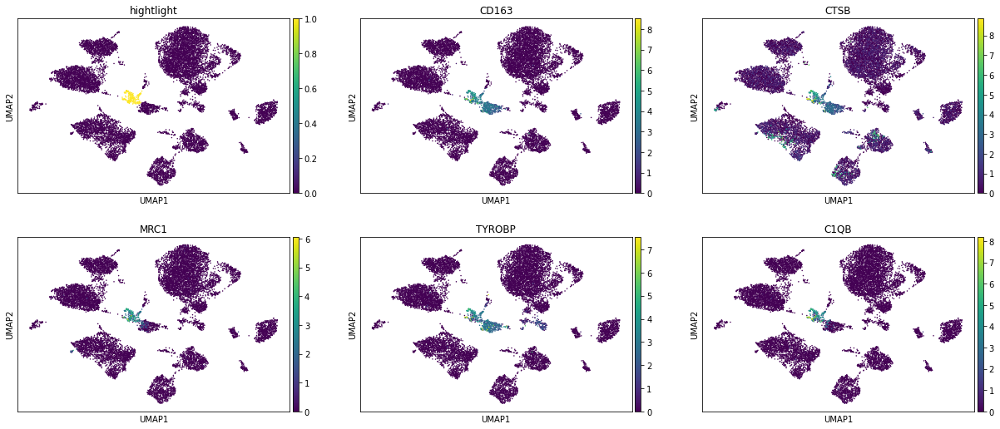

21


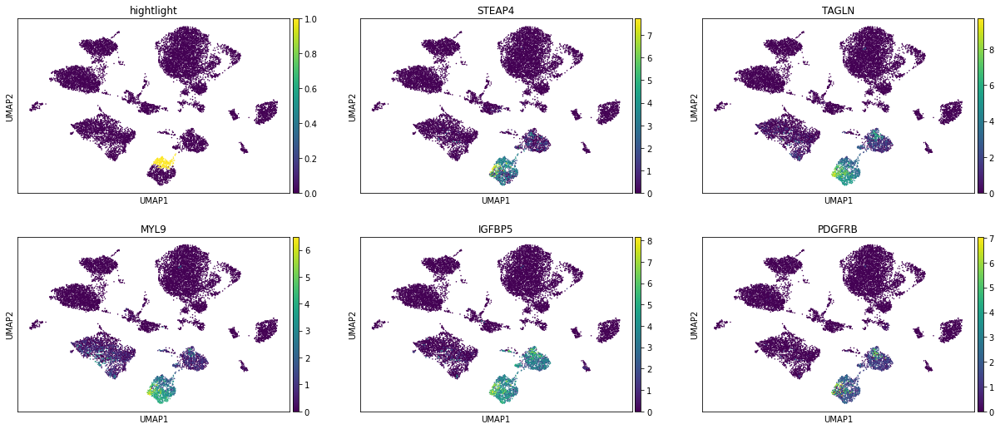

22


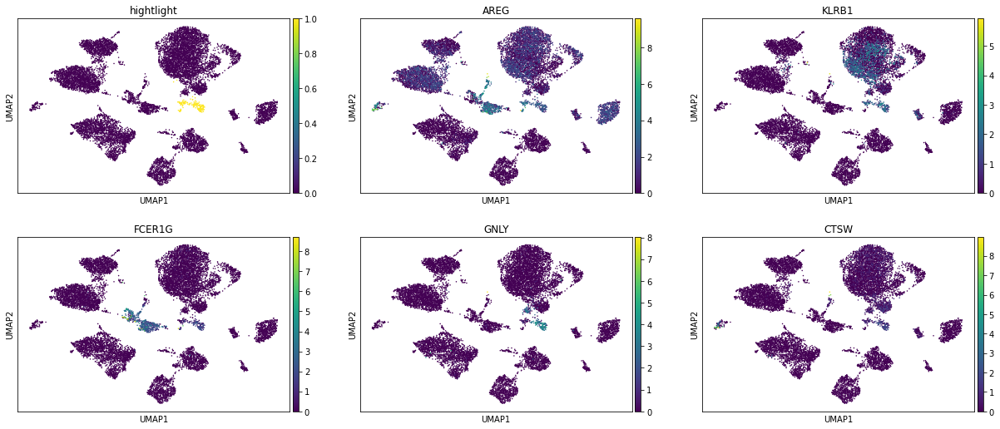

23


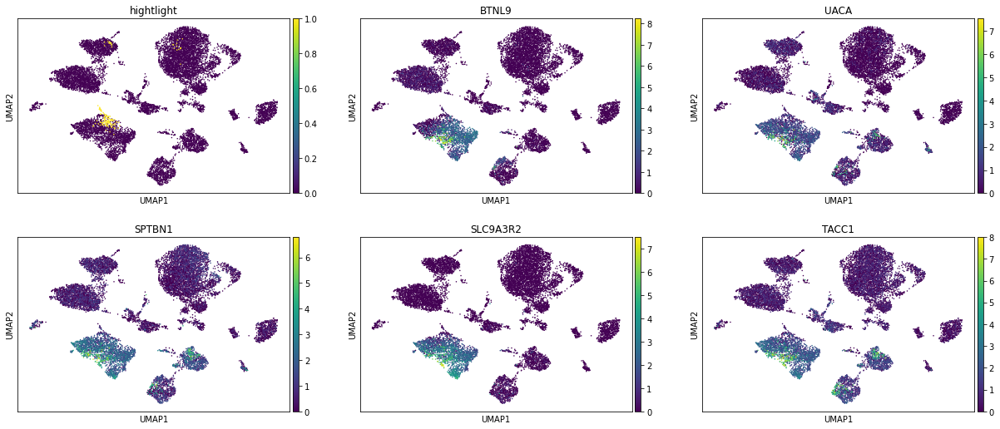

24


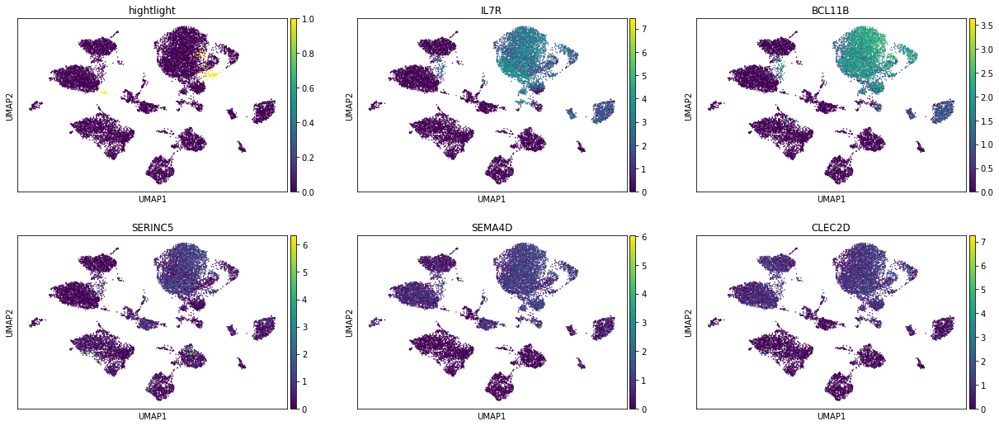

25


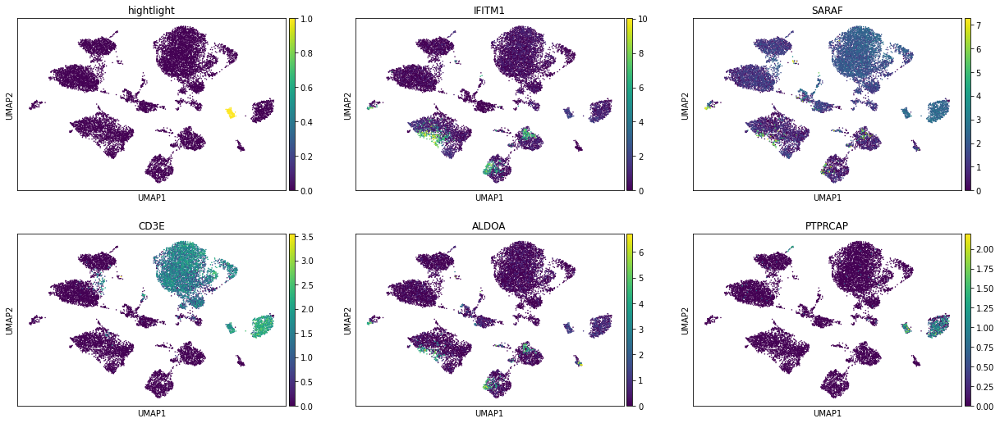

26


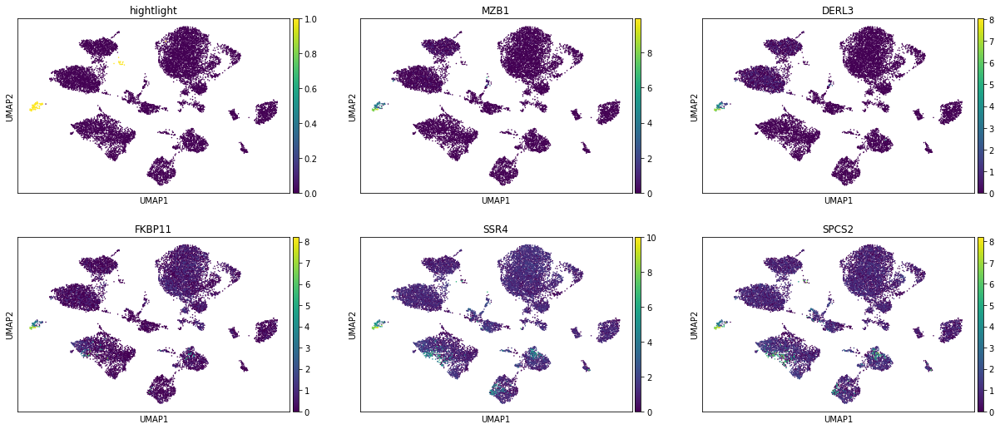

27


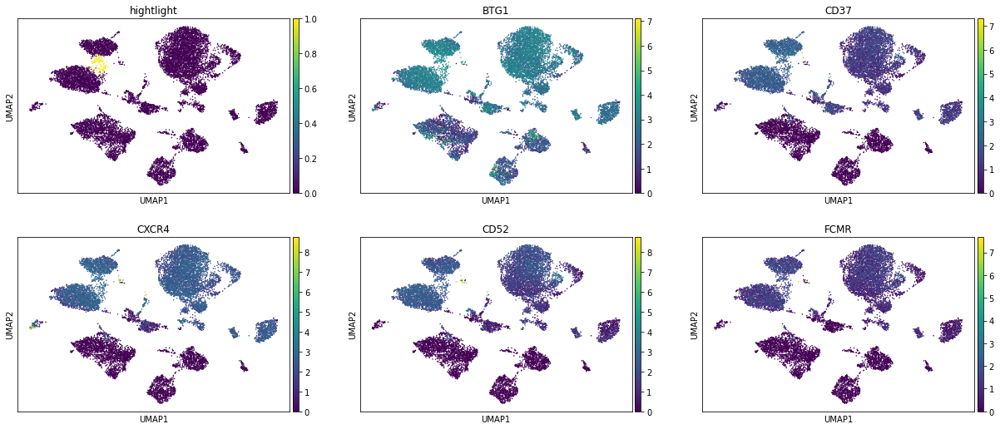

28


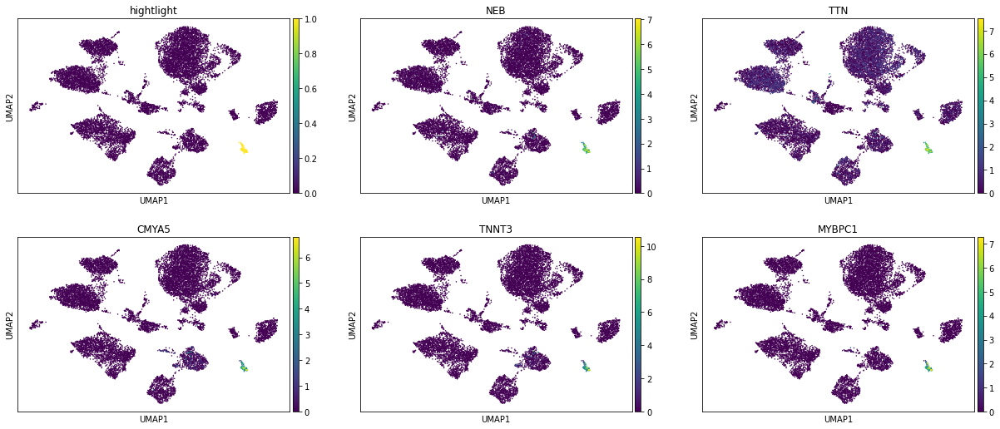

29


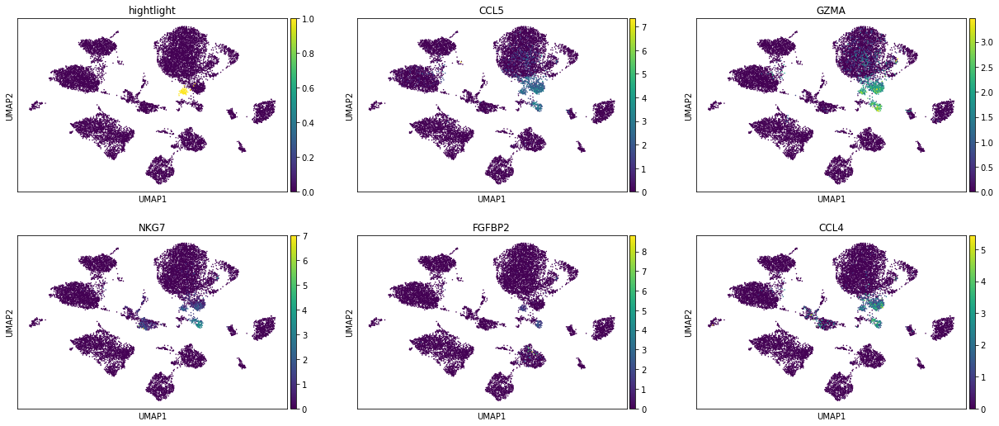

30


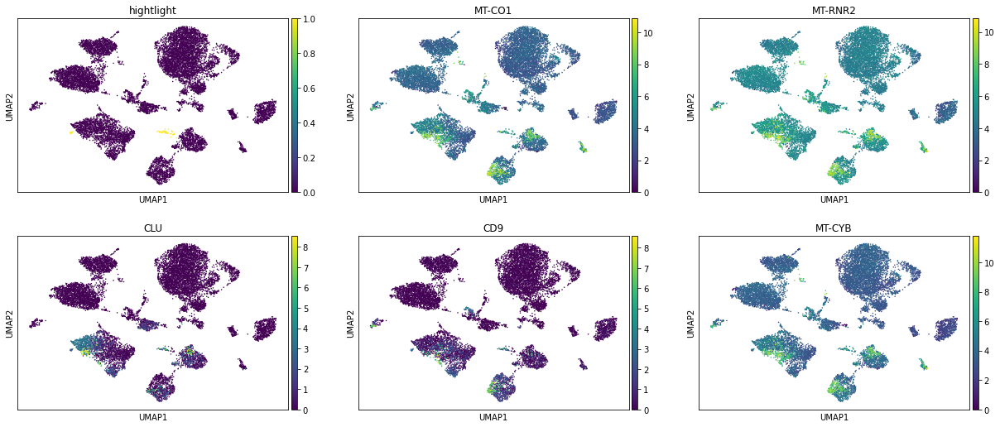

31


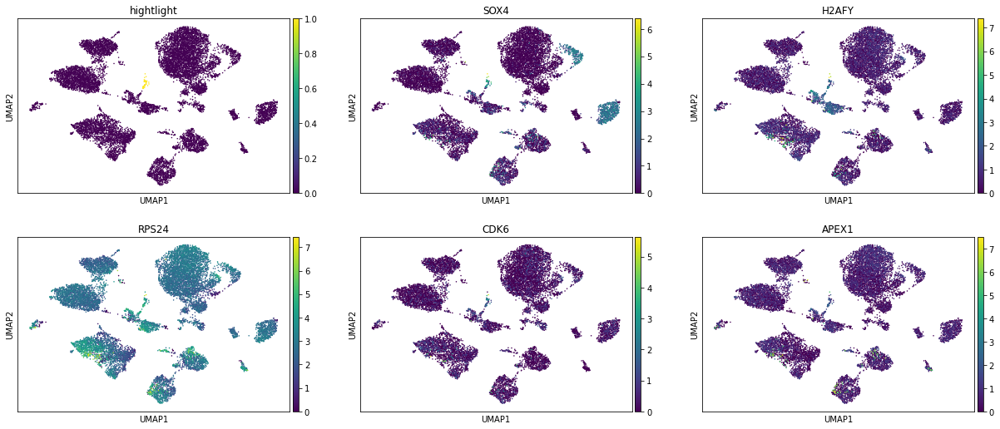

32


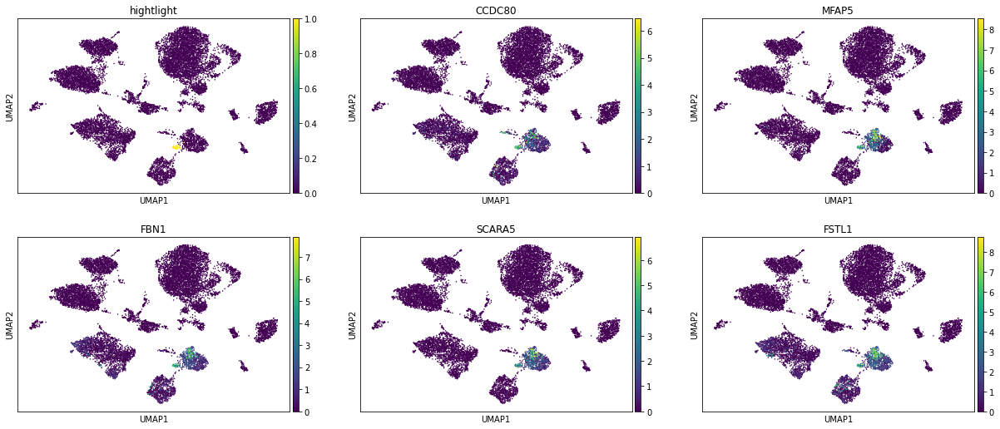

33


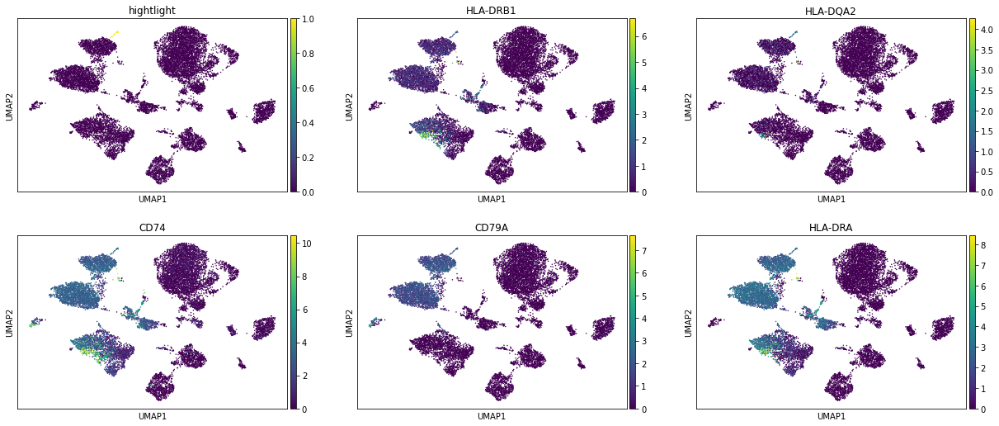

34


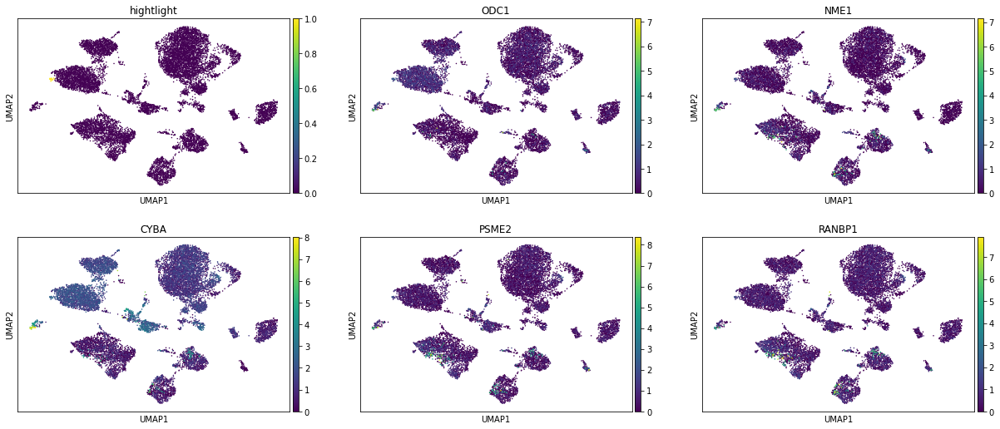

In [25]:
for x in DE.keys():
    print(x)
    topgenes = list(DE[x].T[:5].index)
    organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == x
    sc.pl.umap(
        organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

### The extended DE list can be queried by 

In [26]:
DE["0"].T

,wilcoxon_score,log fold change,adjusted pvalue
RPS12,42.249374,1.750693,0.000000e+00
BCL11B,41.448414,2.939640,0.000000e+00
RPL30,39.888783,1.387424,0.000000e+00
RPS13,39.593407,1.341799,0.000000e+00
RPL13,39.551025,1.424193,0.000000e+00
...,...,...,...
CD74,-20.687851,-4.128025,1.388070e-92
HLA-DRA,-20.757797,-30.439148,3.299146e-93
AHNAK,-21.587315,-2.524376,7.950974e-101
MEF2C,-22.541916,-29.522509,5.893958e-110


# read in cell ontology 

In [27]:
import obonet

ont_dir = "/data/yosef2/users/chenling/TabulaSapiensData/ontology/"
obo = ont_dir + "cl.obo.txt"
f = open(obo, "r")
co = obonet.read_obo(f)
f.close()

celltype_dict = {}
for x in co.nodes:
    celltype_dict[co.nodes[x]['name']] = x



You can look up all T cell by typing celltype_dict['T'] and using tab complete  

In [28]:
celltype_dict['T cell']

'CL:0000084'

You can also look at the names of all subsets of T cell that contains 'CD4' in their names

In [29]:
import networkx as nx


def PrintChildren(co, parent, pattern=""):
    all_children = [x for x in nx.ancestors(co, celltype_dict[parent])]
    return [co.nodes[x]["name"] for x in all_children if pattern in co.nodes[x]["name"]]


PrintChildren(co, "T cell", "CD4")

['CD4-positive helper T cell',
 'CD4-positive type I NK T cell secreting interleukin-4',
 'CD4-negative, CD8-negative, alpha-beta intraepithelial T cell',
 'activated CD4-positive, CD25-positive, CCR4-positive, alpha-beta regulatory T cell, human',
 'effector CD4-positive, alpha-beta T cell',
 'CD4-positive, alpha-beta thymocyte',
 'CD4-positive, CXCR3-negative, CCR6-negative, alpha-beta T cell',
 'CD4-positive, CD8-intermediate double-positive thymocyte',
 'activated CD4-negative, CD8-negative type I NK T cell',
 'CD4-negative, CD8-negative type I NK T cell secreting interleukin-4',
 'CD4-positive, alpha-beta cytotoxic T cell',
 'CD24-positive, CD4 single-positive thymocyte',
 'activated CD4-positive, alpha-beta T cell',
 'CD4-negative, CD8-negative type I NK T cell secreting interferon-gamma',
 'CD4-positive type I NK T cell secreting interferon-gamma',
 'activated CD4-positive type I NK T cell',
 'CD69-positive, CD4-positive single-positive thymocyte',
 'CD4-positive, alpha-beta int

# manually create mapping between cluster and cell type (this is just an example), and the relevant marker genes that was used to generate this prediction

In [30]:
organ_adata.obs["annotation_oct2020"] = organ_adata.obs["leiden"].copy()
cluster_mapping = {"0": "T cell"}
cluster_markers = {"0": ["CXCR4", "CD3D", "IL7R", "IL32"]}

This cell will automatically replace the leiden cluster names with cell type annotations

In [31]:
for l in cluster_mapping.keys():
    organ_adata.obs["annotation_oct2020"].replace(l, cluster_mapping[l], inplace=True)
    display(DE[l][cluster_markers[l]])

,CXCR4,CD3D,IL7R,IL32
wilcoxon_score,1.793758e+01,3.493541e+01,3.719960e+01,3.201259e+01
log fold change,1.271460e+00,2.372175e+00,3.133072e+00,2.025606e+00
adjusted pvalue,1.459856e-69,2.952911e-264,1.853633e-299,5.795638e-222


# Visualize the results of the manual annotation

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



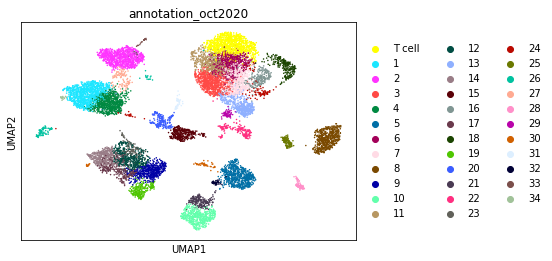

In [32]:
sc.pl.umap(
    organ_adata,
    color=["annotation_oct2020"],
    ncols=3,
)

# manually create mapping between cell type and compartment (this is just an example)

In [33]:
organ_adata.obs["compartment_oct2020"] = organ_adata.obs["annotation_oct2020"].copy()
compartment_mapping = {"T cell": "Immune"}

This cell will automatically replace the leiden cluster names with cell type annotations

In [34]:
for c in compartment_mapping.keys():
    organ_adata.obs["compartment_oct2020"].replace(
        c, compartment_mapping[c], inplace=True
    )

# Visualize the results of the new compartment splitting

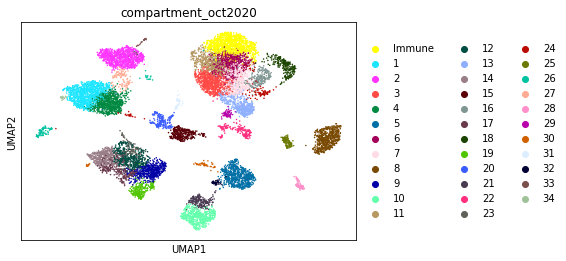

In [35]:
sc.pl.umap(
    organ_adata,
    color=["compartment_oct2020"],
    ncols=3,
)

# save data

In [36]:
organ_adata.write_h5ad(
    data_path + "decontX/organ_data/Pilot1_Pilot2.decontX.%s.h5ad" % organ
)